In [1]:
import io
import time
import torch
import numpy as np
import PIL
from torchvision.transforms import ToPILImage, PILToTensor
from datasets import load_dataset, Image
from walloc import walloc
from diffusers.models.autoencoders import AutoencoderKL
from piq import LPIPS, DISTS, psnr, multi_scale_ssim

class Config: pass

In [2]:
codec = AutoencoderKL.from_pretrained("stabilityai/stable-diffusion-3-medium-diffusers", subfolder='vae')
codec.eval();

In [3]:
lpips_loss = LPIPS().to("cuda")
dists_loss = DISTS().to("cuda")

/home/dgj335/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/dgj335/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [4]:
dataset = load_dataset("danjacobellis/LSDIR", split='validation')

Resolving data files:   0%|          | 0/195 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/195 [00:00<?, ?it/s]

In [5]:
def stable_diffusion_compress(sample):
    
    with torch.no_grad():
        img = sample['image']
        x = PILToTensor()(img).to(torch.float)
        x = (x/255 - 0.5).unsqueeze(0).to(device)
        H, W = x.size(2), x.size(3)
        x_padded = walloc.pad(x,p=8)
    
        t0 = time.time()
        Y = codec.encode(x).latent_dist.mode().to(torch.float16)
        encode_time = time.time() - t0
    
        t0 = time.time()
        x_hat = codec.decode(Y.to(torch.float)).sample
        x_hat = x_hat.clamp(-0.5,0.5)
        decode_time = time.time() - t0
        
        x_hat = walloc.crop(x_hat, (H,W))
        rec = ToPILImage()(x_hat[0] + 0.5)
        buff2 = io.BytesIO()
        rec.save(buff2, format='png', lossless=True)
        rec_png_bytes = buff2.getbuffer()
    
        bpp = 4.
        PSNR = psnr(x+0.5,x_hat+0.5)
        MSSIM = multi_scale_ssim(x+0.5,x_hat+0.5)
        LPIPS_dB = -10*np.log10(lpips_loss(x.to("cuda")+0.5, x_hat.to("cuda")+0.5).item())
        DISTS_dB = -10*np.log10(dists_loss(x.to("cuda")+0.5, x_hat.to("cuda")+0.5).item())        
        
        return {
            'recovered': rec_png_bytes,
            'compressed': Y,
            'encode_time': encode_time,
            'decode_time': decode_time,
            'bpp': bpp,
            'PSNR': PSNR,
            'MSSIM': MSSIM,
            'LPIPS_dB': LPIPS_dB,
            'DISTS_dB': DISTS_dB,
        }

In [6]:
device = "cuda"
codec = codec.to(device)
stable_diffusion_ds = dataset.map(stable_diffusion_compress)
stable_diffusion_ds = stable_diffusion_ds.cast_column('recovered',Image())

Map:   0%|          | 0/250 [00:00<?, ? examples/s]

/home/dgj335/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


In [ ]:
# def stable_diffusion_compress_cpu(sample):
#     with torch.no_grad():
#         img = sample['image']
#         x = PILToTensor()(img).to(torch.float)
#         x = (x/255 - 0.5).unsqueeze(0).to(device)
#         H, W = x.size(2), x.size(3)
#         x_padded = walloc.pad(x,p=8)
    
#         t0 = time.time()
#         Y = codec.encode(x).latent_dist.mode().to(torch.float16)
#         encode_time = time.time() - t0
    
#         t0 = time.time()
#         x_hat = codec.decode(Y.to(torch.float)).sample
#         x_hat = x_hat.clamp(-0.5,0.5)
#         decode_time = time.time() - t0
                        
#     return {
#         'cpu_encode_time': encode_time,
#         'cpu_decode_time': decode_time,
#     }

In [ ]:
# device = "cpu"
# codec = codec.to(device)
# stable_diffusion_cpu = dataset.map(stable_diffusion_compress_cpu)

In [ ]:
# stable_diffusion_ds = stable_diffusion_ds.add_column('cpu_encode_time',stable_diffusion_cpu['cpu_encode_time'])
# stable_diffusion_ds = stable_diffusion_ds.add_column('cpu_decode_time',stable_diffusion_cpu['cpu_decode_time'])

In [18]:
stable_diffusion_ds.push_to_hub("danjacobellis/stabilityai-stable-diffusion-3-medium-diffusers_fp16",split='validation')

Uploading the dataset shards:   0%|          | 0/3 [00:00<?, ?it/s]

Map:   0%|          | 0/84 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/83 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Map:   0%|          | 0/83 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

CommitInfo(commit_url='https://huggingface.co/datasets/danjacobellis/stabilityai-stable-diffusion-3-medium-diffusers_fp16/commit/19def3fe11bd6b2cc16db44eadae6fa0e7c682c6', commit_message='Upload dataset', commit_description='', oid='19def3fe11bd6b2cc16db44eadae6fa0e7c682c6', pr_url=None, pr_revision=None, pr_num=None)

In [9]:
np.mean(stable_diffusion_ds['bpp'])

4.0

In [10]:
np.mean(stable_diffusion_ds['PSNR'])

20.88047720336914

In [11]:
np.mean(stable_diffusion_ds['LPIPS_dB'])

8.325200889688327

In [12]:
np.mean(stable_diffusion_ds['MSSIM'])

0.8398982782363892

In [13]:
np.mean(stable_diffusion_ds['DISTS_dB'])

13.846453597901826

In [14]:
np.mean(stable_diffusion_ds['encode_time'])

0.019296708106994628

In [15]:
np.mean(stable_diffusion_ds['decode_time'])

0.016736851692199708

In [ ]:
# np.mean(stable_diffusion_ds['cpu_encode_time'])

In [ ]:
# np.mean(stable_diffusion_ds['cpu_decode_time'])

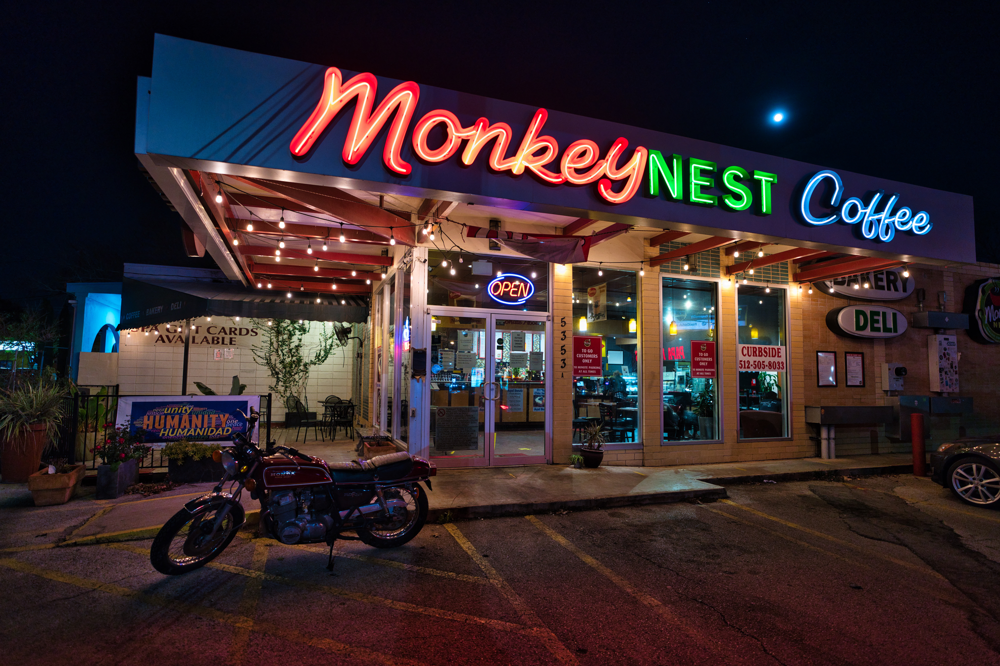

In [16]:
stable_diffusion_ds[28]['image']

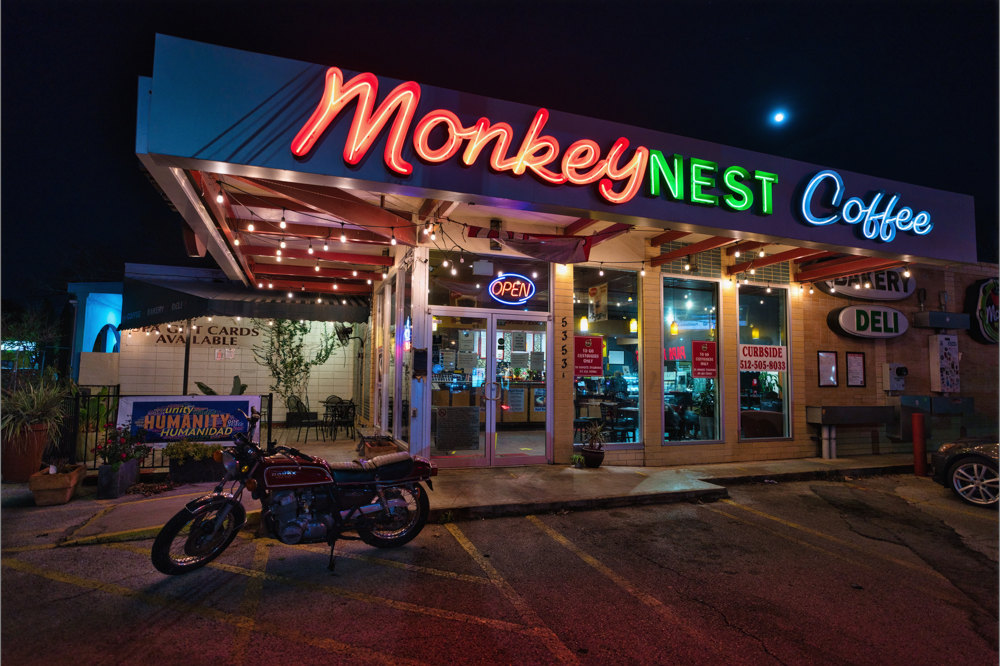

In [17]:
stable_diffusion_ds[28]['recovered']